# Visualization Approaches

## Installing Pydy Pythreejs and Plotly

In [4]:
!pip install pydy
!pip install pythreejs
!pip install plotly
%matplotlib inline

## Usage
### Demonstrating a Randomly moving Cube in Pydy, Plotly and matplotlib

#### Matplotlib

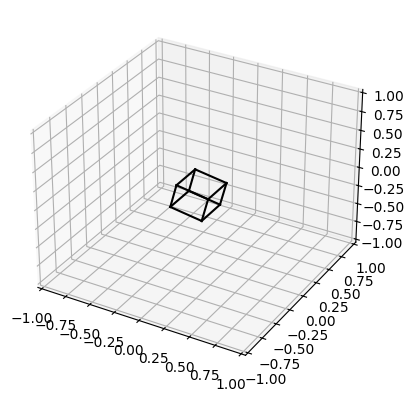

In [2]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D  # enables 3D plotting
from scipy.spatial.transform import Rotation as R
from IPython.display import HTML

# --- Prepare example state data ---

num_timesteps = 100  # number of animation frames

# Initialize states array: 12 values per timestep
# [x, y, z, q1, q2, q3, u_x, u_y, u_z, u_1, u_2, u_3]
states = np.zeros((num_timesteps, 12))

np.random.seed(42)  # for reproducible random values

# Generate small random walk positions for the first 3 state variables (x, y, z)
positions = np.cumsum(0.01 * np.random.randn(num_timesteps, 3), axis=0)
states[:, 0:3] = positions

# Generate some smooth oscillations for Euler angles q1, q2, q3
angles = np.linspace(0, 2*np.pi, num_timesteps)
states[:, 3] = 0.2 * np.sin(angles)      # q1 varies sinusoidally
states[:, 4] = 0.2 * np.cos(angles)      # q2 varies cosinusoidally
states[:, 5] = 0.4 * np.sin(2*angles)    # q3 oscillates faster

# Remaining states are zeroed out for simplicity
states[:, 6:] = 0

# --- Define cube geometry ---

l = 0.32  # cube side length

# 8 vertices of the cube relative to its center (x, y, z)
cube_vertices = np.array([
    [ l/2,  l/2,  l/2],
    [-l/2,  l/2,  l/2],
    [-l/2, -l/2,  l/2],
    [ l/2, -l/2,  l/2],
    [ l/2,  l/2, -l/2],
    [-l/2,  l/2, -l/2],
    [-l/2, -l/2, -l/2],
    [ l/2, -l/2, -l/2]
])

# Edges connect pairs of vertices to form the cube's edges
edges = [
    (0,1),(1,2),(2,3),(3,0),  # top square face
    (4,5),(5,6),(6,7),(7,4),  # bottom square face
    (0,4),(1,5),(2,6),(3,7)   # vertical edges connecting top and bottom
]

# --- Setup matplotlib figure and 3D axis ---

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')  # 3D axes

# Set fixed axes limits for consistent view
ax.set_xlim([-1,1])
ax.set_ylim([-1,1])
ax.set_zlim([-1,1])

# Create a Line3D object for each edge; initially empty
lines = [ax.plot([], [], [], 'k-')[0] for _ in edges]

# --- Initialization function for animation ---
def init():
    # Clear all lines' data so nothing is drawn initially
    for line in lines:
        line.set_data([], [])        # clear x and y data
        line.set_3d_properties([])   # clear z data
    return lines

# --- Animation update function ---
def animate(i):
    # Extract current position and Euler angles at timestep i
    pos = states[i, 0:3]         # x, y, z position of cube center
    euler = states[i, 3:6]       # q1, q2, q3 Euler angles (radians)

    # Create a rotation object from Euler angles (xyz order)
    r = R.from_euler('xyz', euler)

    # Rotate cube vertices according to current orientation
    rotated = r.apply(cube_vertices)

    # Translate rotated vertices by the position vector
    verts = rotated + pos

    # For each edge, update the line data to connect the two vertices
    for line, edge in zip(lines, edges):
        pts = verts[list(edge)]  # get the 2 vertices of this edge
        line.set_data(pts[:,0], pts[:,1])           # set x and y data
        line.set_3d_properties(pts[:,2])            # set z data

    return lines  # return updated line objects for blitting

# --- Create the animation object ---
ani = animation.FuncAnimation(
    fig,               # figure to animate
    animate,           # update function called for each frame
    frames=num_timesteps,  # number of frames
    init_func=init,        # initialization function
    blit=True,             # optimize drawing by re-drawing only changed parts
    interval=30            # delay between frames in milliseconds (~33ms ≈ 30fps)
)

# Display animation as HTML5 video in the notebook
HTML(ani.to_jshtml())


#### PyDy

In [3]:
import numpy as np
import sympy.physics.mechanics as me
from sympy.physics.mechanics import dynamicsymbols
from pydy.viz import Box, VisualizationFrame, Scene
from IPython.display import display, clear_output
import time

# --- Prepare example state data (100 timesteps) ---

num_timesteps = 100  # number of frames in the animation

# Initialize an array to hold states:
# Each row corresponds to [x, y, z, q1, q2, q3, ux, uy, uz, u1, u2, u3]
states = np.zeros((num_timesteps, 12))

np.random.seed(42)  # for reproducibility of random data

# Generate a small random walk for position (x, y, z)
positions = np.cumsum(0.01 * np.random.randn(num_timesteps, 3), axis=0)
states[:, 0:3] = positions  # set position states

# Generate smooth oscillatory Euler angles (q1, q2, q3)
angles = np.linspace(0, 2 * np.pi, num_timesteps)
states[:, 3] = 0.2 * np.sin(angles)      # q1 varies sinusoidally
states[:, 4] = 0.2 * np.cos(angles)      # q2 varies cosinusoidally
states[:, 5] = 0.4 * np.sin(2 * angles)  # q3 oscillates faster

# Set the remaining speed states to zero for simplicity
states[:, 6:] = 0

# --- Define reference frames and points using SymPy Mechanics ---

ISS = me.ReferenceFrame('N')  # Inertial reference frame (ISS frame)
B = me.ReferenceFrame('B')    # Body-fixed reference frame (Astrobee frame)
O = me.Point('O')             # Origin point in ISS frame (can be the Astrobee's center)

# --- Create visualization objects using PyDy ---

l = 0.32  # length of cube edge

# Define a blue cube to represent Astrobee body
cube_shape = Box(l, l, l, color='blue', name='Astrobee')

# Create a VisualizationFrame which associates the cube shape with the body frame and origin
vframe = VisualizationFrame('AstrobeeFrame', B, O, cube_shape)

# --- Define symbolic variables for coordinates and speeds ---

x, y, z = dynamicsymbols('x y z')          # translational coordinates (position)
q1, q2, q3 = dynamicsymbols('q1 q2 q3')    # rotational coordinates (Euler angles)
ux, uy, uz = dynamicsymbols('u_x u_y u_z') # translational speeds (velocities)
u1, u2, u3 = dynamicsymbols('u_1 u_2 u_3') # rotational speeds (angular velocities)

coordinates = [x, y, z, q1, q2, q3]
speeds = [ux, uy, uz, u1, u2, u3]

# --- Setup the visualization scene ---

scene = Scene(ISS, O)  # Create a Scene with ISS as inertial frame and O as origin

# These must be set before adding visualization frames:
scene.states_symbols = coordinates + speeds  # Tell PyDy the symbolic state variables
scene.constants = {}                          # No constants needed here
scene.times = np.linspace(0, 1, num_timesteps)  # Time vector for animation frames

# Add the visualization frame containing the cube shape
scene.visualization_frames = [vframe]

# --- Animation loop ---

for i in range(num_timesteps):
    pos = states[i, 0:3]      # Extract position at timestep i
    euler = states[i, 3:6]    # Extract Euler angles at timestep i

    # Update the position of the origin point O in ISS frame
    O.set_pos(O, pos[0] * ISS.x + pos[1] * ISS.y + pos[2] * ISS.z)

    # Update the orientation of body frame B relative to ISS frame using Euler angles (xyz convention)
    B.orient(ISS, 'Body', euler, 'xyz')

    # Clear previous output in Jupyter to update the visualization cleanly
    clear_output(wait=True)

    # Display the current scene visualization in Jupyter notebook
    display(scene.display_jupyter())

    # Pause briefly so animation is visible (50 milliseconds)
    time.sleep(0.05)


#### Plotly

In [4]:
import numpy as np
import plotly.graph_objects as go
from IPython.display import IFrame

def create_cube_mesh(x, y, z, size=1.0):
    """
    Create a Plotly Mesh3d object representing a cube centered at (x, y, z).
    
    Parameters:
    - x, y, z: Coordinates of the cube center.
    - size: Length of each cube edge.
    
    Returns:
    - go.Mesh3d object representing the cube mesh.
    """
    d = size / 2.0  # Half the size to calculate cube vertices around the center

    # Define the 8 vertices of the cube relative to the center position
    vertices = np.array([
        [x - d, y - d, z - d],  # vertex 0
        [x + d, y - d, z - d],  # vertex 1
        [x + d, y + d, z - d],  # vertex 2
        [x - d, y + d, z - d],  # vertex 3
        [x - d, y - d, z + d],  # vertex 4
        [x + d, y - d, z + d],  # vertex 5
        [x + d, y + d, z + d],  # vertex 6
        [x - d, y + d, z + d],  # vertex 7
    ])

    # Define the 12 triangles that make up the cube's faces by vertex indices
    # Each triangle is represented by 3 lists I, J, K of vertex indices.
    I = [0, 0, 0, 1, 1, 2, 2, 3, 4, 4, 5, 6]
    J = [1, 2, 3, 2, 5, 3, 6, 0, 5, 6, 6, 7]
    K = [2, 3, 1, 5, 2, 6, 3, 4, 6, 7, 4, 4]

    # Return the Plotly Mesh3d object for the cube
    return go.Mesh3d(
        x=vertices[:, 0], y=vertices[:, 1], z=vertices[:, 2],  # vertex coordinates
        i=I, j=J, k=K,  # triangle vertex indices
        color='lightblue',  # cube color
        opacity=0.8  # transparency
    )

# --- Create a random trajectory for the cube movement ---

n_frames = 50  # Number of animation frames

# Generate random 3D walk starting at origin
trajectory = np.cumsum(np.random.randn(n_frames, 3) * 0.3, axis=0)

# --- Build animation frames using the cube mesh at each position ---

frames = []
for i in range(n_frames):
    # Create cube mesh at current trajectory position
    cube = create_cube_mesh(*trajectory[i], size=1.5)
    # Add the mesh as a frame to the animation with a unique frame name
    frames.append(go.Frame(data=[cube], name=f"frame{i}"))

# --- Setup the initial cube position (first frame) ---

initial_cube = create_cube_mesh(*trajectory[0], size=1.5)

# --- Create the Plotly figure with initial data and animation frames ---

fig = go.Figure(
    data=[initial_cube],  # start with the cube at the first position
    layout=go.Layout(
        scene=dict(
            xaxis=dict(range=[-10, 10]),  # fixed axis ranges for 3D plot
            yaxis=dict(range=[-10, 10]),
            zaxis=dict(range=[-10, 10]),
        ),
        updatemenus=[dict(            # Add play button for animation controls
            type="buttons",
            buttons=[dict(
                label="Play",
                method="animate",
                args=[None, {
                    "frame": {"duration": 100, "redraw": True},  # frame duration and redraw on update
                    "fromcurrent": True
                }]
            )]
        )]
    ),
    frames=frames  # attach all animation frames to the figure
)

# --- Save animation to an HTML file and embed in the Jupyter notebook ---

fig.write_html("cube_animation.html", auto_open=False)  # save html without opening automatically
IFrame("cube_animation.html", width=800, height=600)    # display the saved animation within notebook cell
